[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/18lcAtxvFn51-newA-r3ZW1wcimq3PsOT?usp=sharing)

# Advanced AI: Transformers for Computer Vision

## Getting the data

In [1]:
!wget https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz
!tar -xvf flower_photos.tgz


--2023-02-24 21:40:07--  https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/jonfernandes/flowers-dataset/main/flower_photos.tgz [following]
--2023-02-24 21:40:08--  https://media.githubusercontent.com/media/jonfernandes/flowers-dataset/main/flower_photos.tgz
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 228813984 (218M) [application/octet-stream]
Saving to: ‘flower_photos.tgz’

flower_photos.tgz   100%[===================>] 218.21M   172MB/s    in 1.3s    

2023-02-24 21:40:22 (172 MB/s) - ‘flower_photo

In [2]:
!ls flower_photos

daisy  dandelion  LICENSE.txt  roses  sunflowers  tulips


## Using datasets

In [3]:
!pip install transformers==4.24.0 datasets==2.7.1 evaluate==0.3.0 gradio==3.12.0 huggingface_hub==0.11.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 66.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 451.7/451.7 KB 48.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 KB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 85.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.4/182.4 KB 23.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 115.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 KB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.7/140.7 KB 22.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 94.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 

In [4]:
from datasets import load_dataset

ds = load_dataset('imagefolder', data_files='https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz')
ds

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset imagefolder downloaded and prepared to /root/.cache/huggingface/datasets/imagefolder/default-062daa9e8cf14967/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3670
    })
})

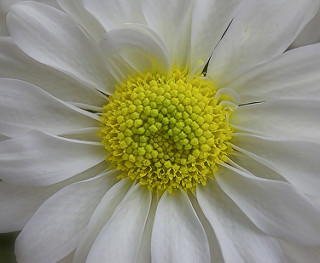

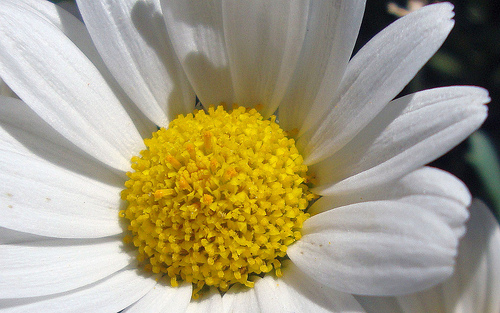

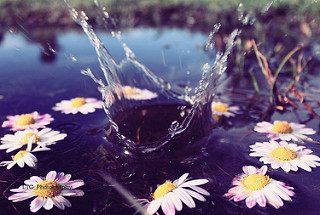

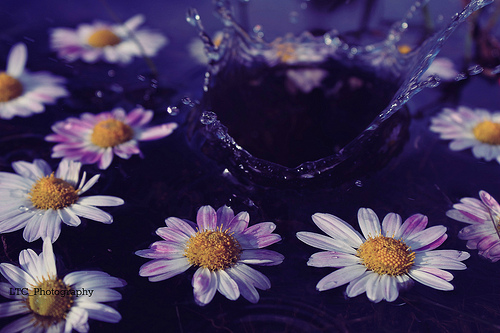

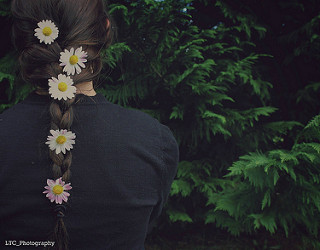

In [5]:
for i in range(5):
  display(ds['train'][i]['image'])

In [6]:
labels = ds['train'].features['label'].names
labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [7]:
ds_train_validation = ds['train'].train_test_split(test_size=0.1, seed=1, shuffle=True)
ds_train_validation

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [8]:
ds_train_validation['validation'] = ds_train_validation.pop('test')
ds_train_validation

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [9]:
ds.update(ds_train_validation)
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [10]:
ds_train_test = ds['train'].train_test_split(test_size=0.1, seed=1, shuffle=True)
ds_train_test

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2972
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 331
    })
})

In [11]:
ds.update(ds_train_test)
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2972
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 331
    })
})

## Using a pre-trained model without fine-tuning

In [12]:
from transformers import AutoModelForImageClassification, AutoFeatureExtractor
import torch
model_id = 'google/vit-base-patch16-224'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
model.eval()


Downloading:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0): ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_

In [13]:
feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
feature_extractor

Downloading:   0%|          | 0.00/160 [00:00<?, ?B/s]

ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}

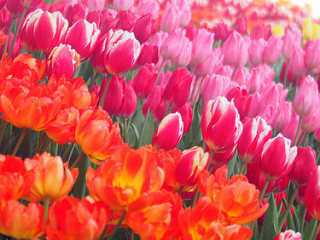

In [14]:
train_image_id = 3
one_image = ds['train'][train_image_id]['image']
one_image

In [15]:
inp = feature_extractor(images=one_image, return_tensors='pt')
inp

{'pixel_values': tensor([[[[ 0.8039,  0.8353,  0.8118,  ...,  0.9922,  1.0000,  1.0000],
          [ 0.7882,  0.6941,  0.6078,  ...,  1.0000,  1.0000,  1.0000],
          [ 0.7098,  0.5686,  0.6235,  ...,  1.0000,  1.0000,  1.0000],
          ...,
          [-0.6941, -0.7176, -0.7490,  ..., -0.2941, -0.1686,  0.2000],
          [-0.6471, -0.7569, -0.8039,  ..., -0.3804, -0.2078,  0.1843],
          [-0.6000, -0.6941, -0.8039,  ..., -0.4510, -0.2549,  0.1686]],

         [[-0.6000, -0.7098, -0.7804,  ...,  0.9922,  1.0000,  1.0000],
          [-0.7255, -0.7412, -0.7961,  ...,  1.0000,  1.0000,  1.0000],
          [-0.7569, -0.7804, -0.8118,  ...,  1.0000,  1.0000,  1.0000],
          ...,
          [-0.7255, -0.7490, -0.8118,  ..., -0.5373, -0.7961, -0.9608],
          [-0.6941, -0.7255, -0.7882,  ..., -0.5765, -0.8196, -0.9529],
          [-0.6235, -0.7176, -0.7804,  ..., -0.6000, -0.8431, -0.9686]],

         [[-0.0745, -0.1765, -0.2157,  ...,  0.9922,  1.0000,  1.0000],
          [-0

In [16]:
#This will not work if you are using a GPU
outp = model(**inp)
outp

RuntimeError: ignored

In [17]:
inp = feature_extractor(images=one_image, return_tensors='pt').to(device)
outp = model(**inp)
outp

ImageClassifierOutput(loss=None, logits=tensor([[-2.6464e-01,  2.4555e-01, -9.3036e-01, -9.0194e-02, -7.2029e-01,
         -6.9272e-01, -2.9417e-01, -1.9733e-02, -3.9561e-01, -1.5814e+00,
          6.9380e-01, -1.0875e+00, -1.6026e+00, -7.1229e-01, -8.6415e-01,
         -9.7715e-02, -1.2807e-01, -7.6172e-01,  1.7135e-03, -1.7973e+00,
         -7.6863e-01, -3.9844e-01, -1.3043e+00, -8.4577e-01, -2.6171e-01,
         -1.0951e+00, -7.4436e-01, -1.4295e+00, -1.1153e+00, -6.6914e-01,
         -1.1013e+00, -1.2264e+00, -9.7091e-01, -1.1745e+00, -6.0650e-01,
         -9.0991e-01,  1.6858e-02, -1.5617e-01, -8.8858e-01, -6.4105e-01,
         -1.4465e-01, -5.5455e-01, -7.7151e-01, -4.0528e-01,  1.2361e-02,
         -8.4242e-01, -1.1913e+00, -5.2833e-01, -1.3650e+00, -8.8372e-01,
         -1.1699e+00, -2.0225e-01, -7.4793e-01, -1.3463e+00, -1.2216e+00,
         -1.3798e+00, -1.0736e+00, -7.9588e-01, -1.2307e+00, -9.0287e-01,
          2.6091e-01, -1.3655e-01, -9.5352e-01, -7.7036e-01, -7.8704e-01

In [18]:
outp.logits.shape

torch.Size([1, 1000])

In [19]:
torch.argmax(outp.logits, dim=1)

tensor([738], device='cuda:0')

In [20]:
pred = torch.argmax(outp.logits, dim=1).item()
pred

738

In [21]:
model.config

ViTConfig {
  "_name_or_path": "google/vit-base-patch16-224",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "tench, Tinca tinca",
    "1": "goldfish, Carassius auratus",
    "2": "great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias",
    "3": "tiger shark, Galeocerdo cuvieri",
    "4": "hammerhead, hammerhead shark",
    "5": "electric ray, crampfish, numbfish, torpedo",
    "6": "stingray",
    "7": "cock",
    "8": "hen",
    "9": "ostrich, Struthio camelus",
    "10": "brambling, Fringilla montifringilla",
    "11": "goldfinch, Carduelis carduelis",
    "12": "house finch, linnet, Carpodacus mexicanus",
    "13": "junco, snowbird",
    "14": "indigo bunting, indigo finch, indigo bird, Passerina cyanea",
    "15": "robin, American robin, Turdus migratorius",
    "16": "bulbul",
 

In [22]:
model.config.id2label[pred]

'pot, flowerpot'

In [23]:
'daisy' in model.config.label2id

True

## Defining a model

In [24]:
model_id = 'google/vit-base-patch16-224'

In [25]:
labels = ds['train'].features['label'].names
labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [26]:
id2label = {key: value for key, value in enumerate(labels)}
id2label

{0: 'daisy', 1: 'dandelion', 2: 'roses', 3: 'sunflowers', 4: 'tulips'}

In [27]:
label2id = {value:key for key, value in enumerate(labels)}
label2id

{'daisy': 0, 'dandelion': 1, 'roses': 2, 'sunflowers': 3, 'tulips': 4}

In [28]:
model = AutoModelForImageClassification.from_pretrained(model_id,
                                                        num_labels=len(labels),
                                                        id2label=id2label,
                                                        label2id=label2id,
                                                        ignore_mismatched_sizes=True
                                                        )

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Pre-processing images

In [29]:
import torchvision

from torchvision.transforms import (
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    ToTensor,
    Resize,
    CenterCrop
)

In [30]:
normalize = Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)

In [31]:
feature_extractor.size

224

In [32]:
train_transform = Compose(
    [
     RandomResizedCrop(feature_extractor.size),
     RandomHorizontalFlip(),
     ToTensor(),
     normalize
    ]
)

validation_transform = Compose(
        [
            Resize(feature_extractor.size),
            CenterCrop(feature_extractor.size),
            ToTensor(),
            normalize,
        ]
    )

def train_transform_images(images):
  images["pixel_values"] = [train_transform(image.convert("RGB")) for image in images["image"]]
  return images

def validation_transform_images(images):
  images["pixel_values"] = [validation_transform(image.convert("RGB")) for image in images["image"]]
  return images

In [33]:
transformed_ds = ds.with_transform(train_transform_images)
transformed_ds['train'] = ds['train'].with_transform(train_transform_images)
transformed_ds['validation'] = ds['validation'].with_transform(validation_transform_images)
transformed_ds['test'] = ds['test'].with_transform(validation_transform_images)

## A transformed image

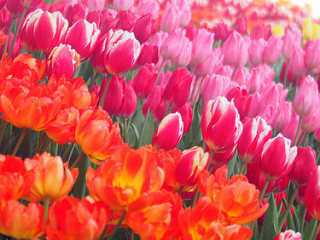

In [34]:
sample_image = ds['train'][train_image_id]['image']
sample_image

TypeError: ignored

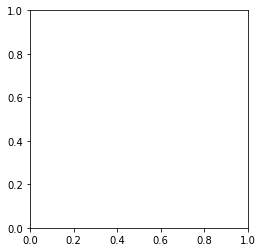

In [35]:
# Re-run cell multiple times (train_transform)
import matplotlib.pyplot as plt
transformed_sample_image = train_transform(sample_image)
plt.imshow(transformed_sample_image)#.permute(1, 2, 0))

In [36]:
transformed_sample_image

tensor([[[ 0.9059,  0.9294,  0.9294,  ...,  0.7647,  0.9373,  0.6863],
         [ 0.9529,  0.9451,  0.9216,  ...,  0.8353,  0.8824,  0.8196],
         [ 0.9373,  0.9294,  0.9059,  ...,  0.9137,  0.9373,  0.7882],
         ...,
         [ 1.0000,  0.8824,  0.9686,  ...,  0.9686,  0.9686,  0.9686],
         [ 0.9843,  0.9451,  0.9686,  ...,  1.0000,  0.9922,  0.9765],
         [ 0.8980,  0.9373,  0.9922,  ...,  0.9843,  0.9843,  0.9765]],

        [[ 0.2314,  0.4275,  0.5765,  ...,  0.7882,  0.8510,  0.8039],
         [ 0.1922,  0.3412,  0.4588,  ...,  0.4902,  0.6392,  0.7961],
         [ 0.0118,  0.1373,  0.2235,  ...,  0.4667,  0.5451,  0.7255],
         ...,
         [ 0.0039, -0.1294, -0.2235,  ..., -0.8353, -0.8745, -0.9137],
         [ 0.0039, -0.1137, -0.2078,  ..., -0.9059, -0.9373, -0.9686],
         [-0.0431,  0.0353, -0.1765,  ..., -0.9608, -0.9765, -0.9843]],

        [[ 0.4588,  0.6235,  0.6706,  ...,  0.7176,  0.7961,  0.6549],
         [ 0.4353,  0.5373,  0.5373,  ...,  0

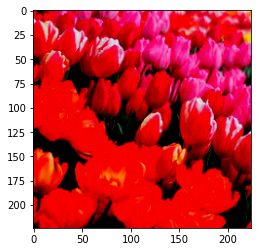

In [37]:
# Re-run cell multiple times (validation_transform)
import matplotlib.pyplot as plt
transformed_sample_image = validation_transform(sample_image)
plt.imshow(transformed_sample_image.permute(1, 2, 0))

## Getting images in the correct format

**4-images**

In [38]:
four_images = [transformed_ds['train'][i] for i in range(4)]
four_images

[{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=159x240 at 0x7FF2423C07C0>,
  'label': 1,
  'pixel_values': tensor([[[ 0.1922,  0.1843,  0.1843,  ..., -0.5294, -0.5294, -0.5373],
           [ 0.1922,  0.1843,  0.1843,  ..., -0.5294, -0.5294, -0.5373],
           [ 0.1922,  0.1843,  0.1843,  ..., -0.5294, -0.5294, -0.5373],
           ...,
           [-0.0510, -0.1294, -0.1922,  ..., -0.5765, -0.5765, -0.5765],
           [-0.0980, -0.1686, -0.1922,  ..., -0.5608, -0.5765, -0.5765],
           [-0.0902, -0.1608, -0.1843,  ..., -0.5451, -0.5686, -0.5843]],
  
          [[ 0.4118,  0.4039,  0.4039,  ..., -0.2392, -0.2392, -0.2471],
           [ 0.4118,  0.4039,  0.4039,  ..., -0.2392, -0.2392, -0.2471],
           [ 0.4118,  0.4039,  0.4039,  ..., -0.2392, -0.2392, -0.2471],
           ...,
           [-0.0667, -0.1529, -0.2000,  ..., -0.2314, -0.2314, -0.2314],
           [-0.1137, -0.1843, -0.2078,  ..., -0.2314, -0.2314, -0.2392],
           [-0.1059, -0.1843, -0.2000

In [39]:
print(four_images[0]['pixel_values'].shape, four_images[1]['pixel_values'].shape, four_images[2]['pixel_values'].shape, four_images[3]['pixel_values'].shape)

torch.Size([3, 224, 224]) torch.Size([3, 224, 224]) torch.Size([3, 224, 224]) torch.Size([3, 224, 224])


In [40]:
four_images_labels = [image['label'] for image in four_images]
four_images_labels

[1, 4, 1, 4]

In [41]:
import torch
four_images_labels = torch.tensor([image['label'] for image in four_images])
four_images_labels

tensor([1, 4, 1, 4])

In [42]:
#will get an error
four_images_pixel_values = torch.tensor([image['pixel_values'] for image in four_images])
four_images_pixel_values

ValueError: ignored

In [43]:
four_images_pixel_values = torch.cat([image['pixel_values'] for image in four_images])
four_images_pixel_values

tensor([[[ 0.1922,  0.1843,  0.1843,  ..., -0.5294, -0.5294, -0.5373],
         [ 0.1922,  0.1843,  0.1843,  ..., -0.5294, -0.5294, -0.5373],
         [ 0.1922,  0.1843,  0.1843,  ..., -0.5294, -0.5294, -0.5373],
         ...,
         [-0.0510, -0.1294, -0.1922,  ..., -0.5765, -0.5765, -0.5765],
         [-0.0980, -0.1686, -0.1922,  ..., -0.5608, -0.5765, -0.5765],
         [-0.0902, -0.1608, -0.1843,  ..., -0.5451, -0.5686, -0.5843]],

        [[ 0.4118,  0.4039,  0.4039,  ..., -0.2392, -0.2392, -0.2471],
         [ 0.4118,  0.4039,  0.4039,  ..., -0.2392, -0.2392, -0.2471],
         [ 0.4118,  0.4039,  0.4039,  ..., -0.2392, -0.2392, -0.2471],
         ...,
         [-0.0667, -0.1529, -0.2000,  ..., -0.2314, -0.2314, -0.2314],
         [-0.1137, -0.1843, -0.2078,  ..., -0.2314, -0.2314, -0.2392],
         [-0.1059, -0.1843, -0.2000,  ..., -0.2314, -0.2392, -0.2471]],

        [[ 0.6000,  0.5922,  0.5922,  ..., -0.0902, -0.0902, -0.0980],
         [ 0.6000,  0.5922,  0.5922,  ..., -0

In [44]:
four_images_pixel_values.shape

torch.Size([12, 224, 224])

In [45]:
four_images_pixel_values = torch.stack([image['pixel_values'] for image in four_images])
four_images_pixel_values.shape

torch.Size([4, 3, 224, 224])

In [46]:
from torch.utils.data import DataLoader

def collate_fn(images):
  labels = torch.tensor([image['label'] for image in images])
  pixel_values = torch.stack([image['pixel_values'] for image in images])
  return {'pixel_values': pixel_values, 'labels': labels}

train_dataloader = DataLoader(transformed_ds['train'], batch_size=4, collate_fn=collate_fn, shuffle=True)
validation_dataloader = DataLoader(transformed_ds['validation'], batch_size=4, collate_fn=collate_fn, shuffle=False)
test_dataloader = DataLoader(transformed_ds['test'], batch_size=4, collate_fn=collate_fn, shuffle=False)

In [47]:
batch = next(iter(train_dataloader))

for key, value in batch.items():
  print(key, value.shape)

pixel_values torch.Size([4, 3, 224, 224])
labels torch.Size([4])


## Training arguments

In [48]:
from transformers import TrainingArguments, Trainer

batch_size=32
metric_name = "accuracy"
model_name = 'vit-base-patch16-224-finetuned-flower'

args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=3,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs', 
    push_to_hub=True
)

In [49]:
from huggingface_hub import notebook_login
notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.huggingface/token
Login successful


In [52]:
!git config --global credential.helper store

## Model Training

In [53]:
args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=1,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs', 
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=transformed_ds['train'],
    eval_dataset=transformed_ds['validation'],
    tokenizer=feature_extractor,
    data_collator=collate_fn,
)

trainer.train()

using `logging_steps` to initialize `eval_steps` to 500
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).
/usr/local/lib/python3.8/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 2972
  Num Epochs = 1
  Instantaneous batch size per device = 32
  Total train batch size (w. parallel, distributed & accumulation) = 32
  Gradient Accumulation steps = 1
  Total optimization steps = 93
  Number of trainable parameters = 85802501


Step,Training Loss,Validation Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=93, training_loss=0.1537701904132802, metrics={'train_runtime': 109.5185, 'train_samples_per_second': 27.137, 'train_steps_per_second': 0.849, 'total_flos': 2.303123856192553e+17, 'train_loss': 0.1537701904132802, 'epoch': 1.0})

In [54]:
trainer.predict(transformed_ds['test'])

***** Running Prediction *****
  Num examples = 331
  Batch size = 32


PredictionOutput(predictions=array([[-2.0787616 , -0.9554883 , -0.6529368 , -1.5306528 ,  5.1239405 ],
       [-1.1515045 ,  5.234435  , -2.2685826 , -1.4013529 , -1.8878688 ],
       [-0.5430166 , -0.5517937 , -0.18900865, -1.0678387 ,  4.4213953 ],
       ...,
       [-0.91554296, -0.51935434,  2.9740283 , -1.0143806 ,  0.81432366],
       [-1.3620796 , -2.1094854 ,  4.8640375 , -1.3510271 , -0.01923384],
       [-0.82862824,  6.381325  , -1.3121578 , -2.1190627 , -2.1048558 ]],
      dtype=float32), label_ids=array([4, 1, 4, 1, 0, 1, 4, 1, 3, 3, 3, 3, 4, 0, 2, 0, 3, 1, 4, 2, 0, 4,
       3, 3, 3, 2, 4, 1, 0, 3, 1, 0, 1, 1, 4, 1, 2, 0, 4, 3, 0, 3, 4, 4,
       0, 3, 1, 4, 1, 3, 1, 0, 2, 4, 1, 0, 4, 3, 3, 3, 0, 1, 4, 0, 1, 4,
       2, 4, 2, 0, 3, 0, 4, 1, 3, 3, 4, 3, 4, 3, 3, 1, 0, 2, 4, 3, 4, 1,
       4, 0, 1, 4, 0, 0, 1, 1, 0, 1, 0, 4, 2, 4, 4, 4, 0, 3, 2, 1, 4, 4,
       4, 4, 4, 1, 3, 0, 2, 2, 4, 0, 0, 4, 0, 2, 4, 3, 4, 1, 3, 0, 1, 1,
       4, 3, 0, 1, 0, 2, 3, 2, 2, 2, 2, 4, 4

From the [evaluate documentation](https://huggingface.co/docs/evaluate/a_quick_tour#compute):

```
metric.compute(
          references=..., 
          predictions=...)
```

In [55]:
import evaluate
import numpy as np

metric = evaluate.load('accuracy')

def compute_metrics(batch):
  return metric.compute(
      references=batch.label_ids,
      predictions=np.argmax(batch.predictions, axis=1))

In [56]:
args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=5,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs', 
    push_to_hub=True
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=transformed_ds['train'],
    eval_dataset=transformed_ds['validation'],
    tokenizer=feature_extractor,
    data_collator=collate_fn,
    compute_metrics=compute_metrics
)

using `logging_steps` to initialize `eval_steps` to 500
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).
Cloning https://huggingface.co/jonathanfernandes/vit-base-patch16-224-finetuned-flower into local empty directory.


Download file pytorch_model.bin:   0%|          | 1.41k/327M [00:00<?, ?B/s]

Download file training_args.bin: 100%|##########| 3.31k/3.31k [00:00<?, ?B/s]

Clean file training_args.bin:  30%|###       | 1.00k/3.31k [00:00<?, ?B/s]

Clean file pytorch_model.bin:   0%|          | 1.00k/327M [00:00<?, ?B/s]

In [57]:
%load_ext tensorboard
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [58]:
trainer.train()
trainer.save_model()

/usr/local/lib/python3.8/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 2972
  Num Epochs = 5
  Instantaneous batch size per device = 32
  Total train batch size (w. parallel, distributed & accumulation) = 32
  Gradient Accumulation steps = 1
  Total optimization steps = 465
  Number of trainable parameters = 85802501


Step,Training Loss,Validation Loss




Training completed. Do not forget to share your model on huggingface.co/models =)


Saving model checkpoint to vit-base-patch16-224-finetuned-flower
Configuration saved in vit-base-patch16-224-finetuned-flower/config.json
Model weights saved in vit-base-patch16-224-finetuned-flower/pytorch_model.bin
Feature extractor saved in vit-base-patch16-224-finetuned-flower/preprocessor_config.json
Saving model checkpoint to vit-base-patch16-224-finetuned-flower
Configuration saved in vit-base-patch16-224-finetuned-flower/config.json
Model weights saved in vit-base-patch16-224-finetuned-flower/pytorch_model.bin
Feature extractor saved in vit-base-patch16-224-finetuned-flower/preprocessor_config.json


Upload file pytorch_model.bin:   0%|          | 32.0k/327M [00:00<?, ?B/s]

remote: Scanning LFS files for validity...        
remote: LFS file scan complete.        
To https://huggingface.co/jonathanfernandes/vit-base-patch16-224-finetuned-flower
   ce34a33..b75a802  main -> main

remote: LFS file scan complete.        
To https://huggingface.co/jonathanfernandes/vit-base-patch16-224-finetuned-flower
   ce34a33..b75a802  main -> main

Dropping the following result as it does not have all the necessary fields:
{'task': {'name': 'Image Classification', 'type': 'image-classification'}, 'dataset': {'name': 'imagefolder', 'type': 'imagefolder', 'config': 'default', 'split': 'train', 'args': 'default'}}


In [59]:
trainer.evaluate(transformed_ds['train'])

***** Running Evaluation *****
  Num examples = 2972
  Batch size = 32


{'eval_loss': 0.037790440022945404,
 'eval_accuracy': 0.9875504710632571,
 'eval_runtime': 47.035,
 'eval_samples_per_second': 63.187,
 'eval_steps_per_second': 1.977,
 'epoch': 5.0}

In [60]:
trainer.evaluate(transformed_ds['validation'])

***** Running Evaluation *****
  Num examples = 367
  Batch size = 32


{'eval_loss': 0.08171983063220978,
 'eval_accuracy': 0.9809264305177112,
 'eval_runtime': 6.6083,
 'eval_samples_per_second': 55.536,
 'eval_steps_per_second': 1.816,
 'epoch': 5.0}

In [61]:
trainer.evaluate(transformed_ds['test'])

***** Running Evaluation *****
  Num examples = 331
  Batch size = 32


{'eval_loss': 0.06060546636581421,
 'eval_accuracy': 0.9879154078549849,
 'eval_runtime': 5.7705,
 'eval_samples_per_second': 57.361,
 'eval_steps_per_second': 1.906,
 'epoch': 5.0}

## Inference in notebook

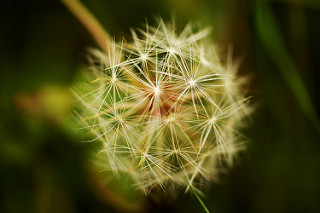

In [62]:
test_image = ds['test'][-1]['image']
test_image

In [63]:
import torch
from transformers import AutoModelForImageClassification, AutoFeatureExtractor

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'

def classify_image(image):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)  
  inp = feature_extractor(image, return_tensors='pt').to(device)
  outp = model(**inp)
  pred = torch.argmax(outp.logits, dim=-1).item()
  return model.config.id2label[pred]

classify_image(test_image)

Downloading:   0%|          | 0.00/839 [00:00<?, ?B/s]

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "daisy",
    "1": "dandelion",
    "2": "roses",
    "3": "sunflowers",
    "4": "tulips"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "daisy": 0,
    "dandelion": 1,
    "roses": 2,
    "sunflowers": 3,
    "tulips": 4
  },
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "problem_type": "single_label_cl

Downloading:   0%|          | 0.00/343M [00:00<?, ?B/s]

loading weights file pytorch_model.bin from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/pytorch_model.bin
All model checkpoint weights were used when initializing ViTForImageClassification.

All the weights of ViTForImageClassification were initialized from the model checkpoint at jonathanfernandes/vit-base-patch16-224-finetuned-flower.
If your task is similar to the task the model of the checkpoint was trained on, you can already use ViTForImageClassification for predictions without further training.


Downloading:   0%|          | 0.00/228 [00:00<?, ?B/s]

loading configuration file preprocessor_config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/preprocessor_config.json
Feature extractor ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}



'dandelion'

In [64]:
import torch

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'

def classify_image(image):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt').to(device)
  outp = model(**inp)
  pred = torch.nn.functional.softmax(outp.logits, dim=-1)
  preds = pred[0].cpu().detach().numpy()
  confidence = {label: float(preds[i]) for i, label in enumerate(labels)}
  return confidence

classify_image(test_image)

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "daisy",
    "1": "dandelion",
    "2": "roses",
    "3": "sunflowers",
    "4": "tulips"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "daisy": 0,
    "dandelion": 1,
    "roses": 2,
    "sunflowers": 3,
    "tulips": 4
  },
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "problem_type": "single_label_cl

{'daisy': 2.918864629464224e-05,
 'dandelion': 0.9999024868011475,
 'roses': 2.0446024791453965e-05,
 'sunflowers': 3.4754659282043576e-05,
 'tulips': 1.3023653991695028e-05}

In [66]:
from transformers import pipeline

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'
feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)

image_classifier = pipeline('image-classification', model=model_id, feature_extractor=feature_extractor, framework="pt")
image_classifier(test_image)

loading configuration file preprocessor_config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/preprocessor_config.json
Feature extractor ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden

[{'score': 0.9999024868011475, 'label': 'dandelion'},
 {'score': 3.475455741863698e-05, 'label': 'sunflowers'},
 {'score': 2.918864629464224e-05, 'label': 'daisy'},
 {'score': 2.044598659267649e-05, 'label': 'roses'},
 {'score': 1.302362943533808e-05, 'label': 'tulips'}]

## Inference on your phone using Gradio

In [67]:
!wget https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-1.jpeg
!wget https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-2.jpeg

--2023-02-24 22:03:35--  https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-1.jpeg
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/main/flower-1.jpeg [following]
--2023-02-24 22:03:35--  https://raw.githubusercontent.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/main/flower-1.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 180993 (177K) [image/jpeg]
Saving to: ‘flower-1.jpeg’

flower-1.jpeg       100%[===================>] 176.75K  --.-KB/s    in 0.003s  

2023-02-24 22:03

In [68]:
!ls -l

total 223828
-rw-r--r-- 1 root   root    180993 Feb 24 22:03 flower-1.jpeg
-rw-r--r-- 1 root   root    182353 Feb 24 22:03 flower-2.jpeg
drwxr-x--- 7 270850 5000      4096 Feb 10  2016 flower_photos
-rw-r--r-- 1 root   root 228813984 Feb 24 21:40 flower_photos.tgz
drwxr-xr-x 5 root   root      4096 Feb 24 21:58 logs
drwxr-xr-x 1 root   root      4096 Feb 23 14:38 sample_data
drwxr-xr-x 3 root   root      4096 Feb 24 21:45 vit-base-patch16-224-finetuned-flower


In [69]:
import torch
from transformers import AutoModelForImageClassification, AutoFeatureExtractor
import gradio as gr

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'
labels = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

def classify_image(image):
  model = AutoModelForImageClassification.from_pretrained(model_id)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt')
  outp = model(**inp)
  pred = torch.nn.functional.softmax(outp.logits, dim=-1)
  preds = pred[0].cpu().detach().numpy()
  confidence = {label: float(preds[i]) for i, label in enumerate(labels)}
  return confidence

interface = gr.Interface(fn=classify_image, 
                         inputs='image', 
                         examples=['flower-1.jpeg', 'flower-2.jpeg'],
                         outputs='label').launch(debug=True, share=True)

IMPORTANT: You are using gradio version 3.12.0, however version 3.14.0 is available, please upgrade.
--------
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://573a283776b21fce.gradio.app

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces


loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "daisy",
    "1": "dandelion",
    "2": "roses",
    "3": "sunflowers",
    "4": "tulips"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "daisy": 0,
    "dandelion": 1,
    "roses": 2,
    "sunflowers": 3,
    "tulips": 4
  },
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "problem_type": "single_label_cl

Keyboard interruption in main thread... closing server.
